In [18]:
.libPaths(c('/sc/arion/projects/CommonMind/tereza/conda/envs/dreamlet/lib/R/library', .libPaths()))
.libPaths()

[1] "/sc/arion/projects/CommonMind/tereza/conda/envs/dreamlet/lib/R/library"
[2] "/sc/arion/projects/roussp01a/tereza/R_libs_4_1_v2"

In [19]:
library(dreamlet)
library(Seurat)
library(Signac)
library(ggplot2)
library(dplyr)

set.seed(1234)
getwd()

[1] "/sc/arion/projects/CommonMind/3D_Genome/single_cell/cellranger/Merged_data"

In [20]:
library(SingleR)
setwd('/sc/arion/projects/CommonMind/3D_Genome/single_cell/cellranger/Merged_data/')
getwd()

[1] "/sc/arion/projects/CommonMind/3D_Genome/single_cell/cellranger/Merged_data"

In [4]:
#save as h5ad
.libPaths(c("/sc/arion/projects/roussp01a/tereza/R_libs_4_1_v2/", .libPaths()))
library(SeuratDisk)
library(SeuratData)

Registered S3 method overwritten by 'SeuratDisk':
  method            from  
  as.sparse.H5Group Seurat

-- Installed datasets ------------------------------------- SeuratData v0.2.2 --

v pbmcsca 3.0.0                         


-------------------------------------- Key -------------------------------------

v Dataset loaded successfully
> Dataset built with a newer version of Seurat than installed
(?) Unknown version of Seurat installed




In [5]:
library(basilisk)
library(Seurat)
library(SingleCellExperiment)
getwd()
library(zellkonverter)

[1] "/sc/arion/projects/CommonMind/3D_Genome/single_cell/cellranger/Merged_data"

In [21]:
#------------ monocle3 test
library(monocle3)
library(tidyselect)


Attaching package: 'monocle3'


The following objects are masked from 'package:Biobase':

    exprs, fData, fData<-, pData, pData<-




In [10]:
#------------- load *rds file as a seurat object
olig <- readRDS('./OPC_Olig_all_preprocessed_cdDNA.rds')
olig

An object of class Seurat 
215236 features across 60767 samples within 3 assays 
Active assay: SCT (16196 features, 3000 variable features)
 2 other assays present: RNA, ATAC
 12 dimensional reductions calculated: pca, harmonyBB.pca, umapBB.rnah, lsi, harmonyBB.lsi, umapBB.atach, wnnBB.umap, harmony.dream2BB.pca, umap.dream2BB.rnah, harmony.dream2BB.lsi, umap.dream2BB.atach, wnn.dream2BB.umap

In [11]:
#---- check meta.data slots
colnames(olig@meta.data)

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "gex_barcode"                      
 [5] "atac_barcode"                      "is_cell"                          
 [7] "excluded_reason"                   "gex_raw_reads"                    
 [9] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[11] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[13] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[15] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[17] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[19] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[21] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[23] "gex_genes_count"                   "atac_raw_reads"                   
[25] "atac_unmapped_reads"               "atac_lowmapq"                     
[27] "atac_dup_reads"                    "atac_chimeric_reads"              
[29] "atac_mitochondrial_reads"          "atac_fragments"                   
[31] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[33] "atac_peak_region_cutsites"         "percent.mt"                       
[35] "nCount_ATAC"                       "nFeature_ATAC"                    
[37] "sex"                               "age"                              
[39] "mitoRatio"                         "percent.ribo"                     
[41] "riboRatio"                         "percent.hb"                       
[43] "log10GenesPerUMI"                  "nucleosome_signal"                
[45] "nucleosome_percentile"             "TSS.enrichment"                   
[47] "TSS.percentile"                    "pct_reads_in_peaks"               
[49] "blacklist_fraction"                "brain"                            
[51] "brain.bank"                        "nCount_SCT"                       
[53] "nFeature_SCT"                      "SCT_snn_res.0.2"                  
[55] "seurat_clusters"                   "ATAC_snn_res.0.2"                 
[57] "SCT.weight"                        "ATAC.weight"                      
[59] "wsnn_res.0.2"                      "RNA_snn_res.0.2"                  
[61] "pANN_0.25_0.09_1648"               "DF.classifications_0.25_0.09_1648"
[63] "pANN_0.25_0.09_1940"               "DF.classifications_0.25_0.09_1940"
[65] "pANN_0.25_0.09_2285"               "DF.classifications_0.25_0.09_2285"
[67] "pANN_0.25_0.09_1241"               "DF.classifications_0.25_0.09_1241"
[69] "SCT_snn_res.0.4"                   "ATAC_snn_res.0.4"                 
[71] "wsnn_res.0.4"                      "m1c_labels_subclass"              
[73] "age.group"                         "seurat_clusters_origBB"           
[75] "m1c_labels_subclass_origBB"        "anno_clus"                        
[77] "anno_clus_origBB"                  "anno_clus_origBB2"                
[79] "SCT.dream2BB.weight"               "ATAC.dream2BB.weight"             
[81] "seurat_clusters_dream.origBB"      "seurat_clusters_dreamorigBB"      
[83] "m1c_labels_subclass.dreamBB"       "anno_clus_dreamBB"                
[85] "anno_clus_dreamorigBB"

In [18]:
# downsample data to lower dimension of too large to handle in R
olig <-  olig[, sample(colnames(olig), size =6077, replace=F)]
olig

Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from harmonybb.lsi_ to harmonybblsi_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from harmony.dream2bb.pca_ to harmonydream2bbpca_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap.dream2bb.rnah_ to umapdream2bbrnah_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from harmony.dream2bb.lsi_ to harmonydream2bblsi_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from umap.dream2bb.atach_ to umapdream2bbatach_"
Warning message:
"Keys should be one or more alphanumeric characters followed by an underscore, setting key from wnn.dream2bb.umap_ to wnndream2bbumap_"


An object of class Seurat 
215236 features across 6077 samples within 3 assays 
Active assay: SCT (16196 features, 3000 variable features)
 2 other assays present: RNA, ATAC
 12 dimensional reductions calculated: pca, harmonyBB.pca, umapBB.rnah, lsi, harmonyBB.lsi, umapBB.atach, wnnBB.umap, harmony.dream2BB.pca, umap.dream2BB.rnah, harmony.dream2BB.lsi, umap.dream2BB.atach, wnn.dream2BB.umap

In [ ]:
#================== OPTION 1 - infer pseudotime trajectory on pre-calculated/transferred UMAP



In [ ]:
#--- initiate a new Seurat object for monocle3 to prepare cell_data_set format 

#--- set your assay to either RNA or SCT
o0 <- CreateSeuratObject(counts = olig[['SCT']]@counts,meta.data = olig@meta.data)
o0 <- SetAssayData(o0,slot = 'data',new.data = olig[['SCT']]@data)
o0 <- SetAssayData(o0,slot = 'scale.data',new.data = olig[['SCT']]@scale.data)
o0[['umap']] <- CreateDimReducObject(embeddings = Embeddings(olig,'umap.dream2BB.rnah'),key = 'UMAP_')

# create cell_data_set via SeuratWrappers
cds <- SeuratWrappers::as.cell_data_set(o0)

recreate.partitions <- rep(1, length(cds@colData@rownames))
names(recreate.partitions) <- cds@colData@rownames
recreate.partitions <- as.factor(recreate.partitions)
cds@clusters@listData[["UMAP"]][["partitions"]] <- recreate.partitions
list.cluster <- olig@active.ident
cds@clusters@listData[["UMAP"]][["clusters"]] <- list.cluster

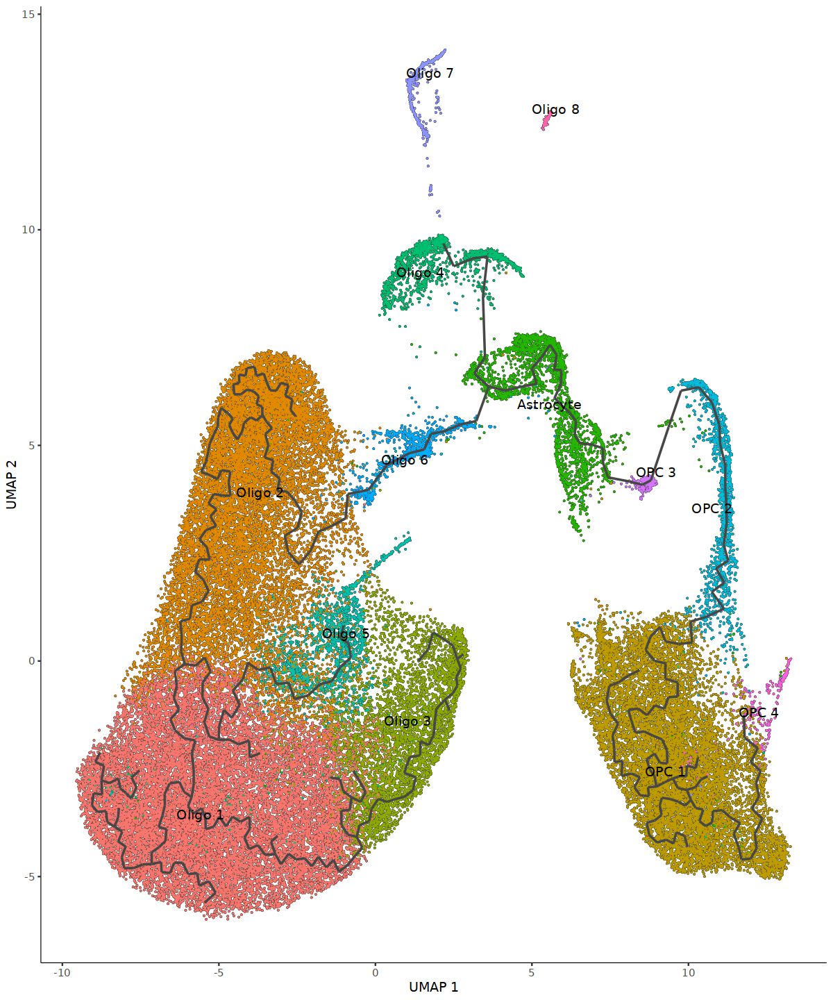

In [129]:
#------ use transferred umap from Seurat object (or elsewhere) to infer pseudotime trajectory
#lear graph based on selected UMAP; color c ells based on selected annotation slot

cds <- learn_graph(cds,use_partition = F,close_loop = F)
plot_cells(cds,color_cells_by = 'anno_clus_dreamorigBB',
           label_branch_points = F,label_leaves = F,label_roots = F,
           group_label_size = 4,label_groups_by_cluster = F)

Cells aren't colored in a way that allows them to be grouped.



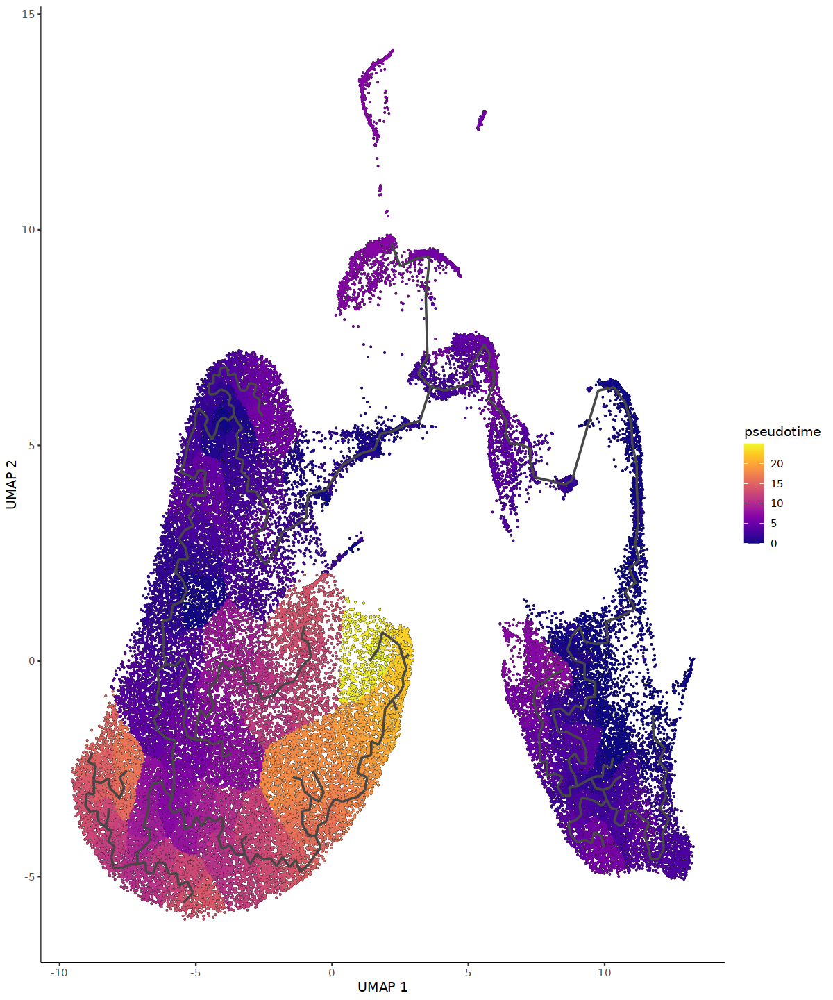

In [130]:
#------ order cells based on pseudotime and set the root of trajectory based on biological knowledge
# in this example, the root is sat as 'OPC 2' cluster with highest enrichment in infants

cds <- order_cells(cds,root_cells = Cells(olig)[olig$anno_clus_dreamorigBB == 'OPC 2'])
plot_cells(cds,color_cells_by = 'pseudotime',
           label_branch_points = F,label_leaves = F,label_roots = F,
           group_label_size = 4,label_groups_by_cluster = F)

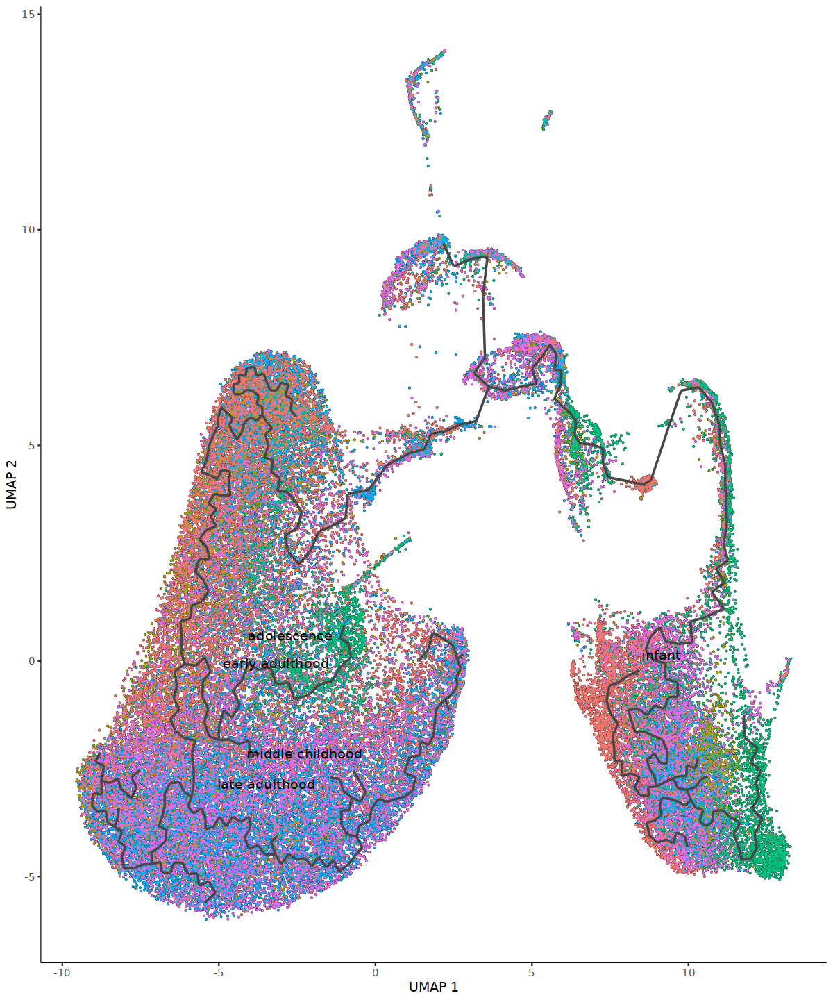

In [131]:
#--- plot cells within selected UMAP and inferred trajectory, colored based on age.group
plot_cells(cds,color_cells_by = 'age.group',
           label_branch_points = F,label_leaves = F,label_roots = F,
           group_label_size = 4,label_groups_by_cluster = F)

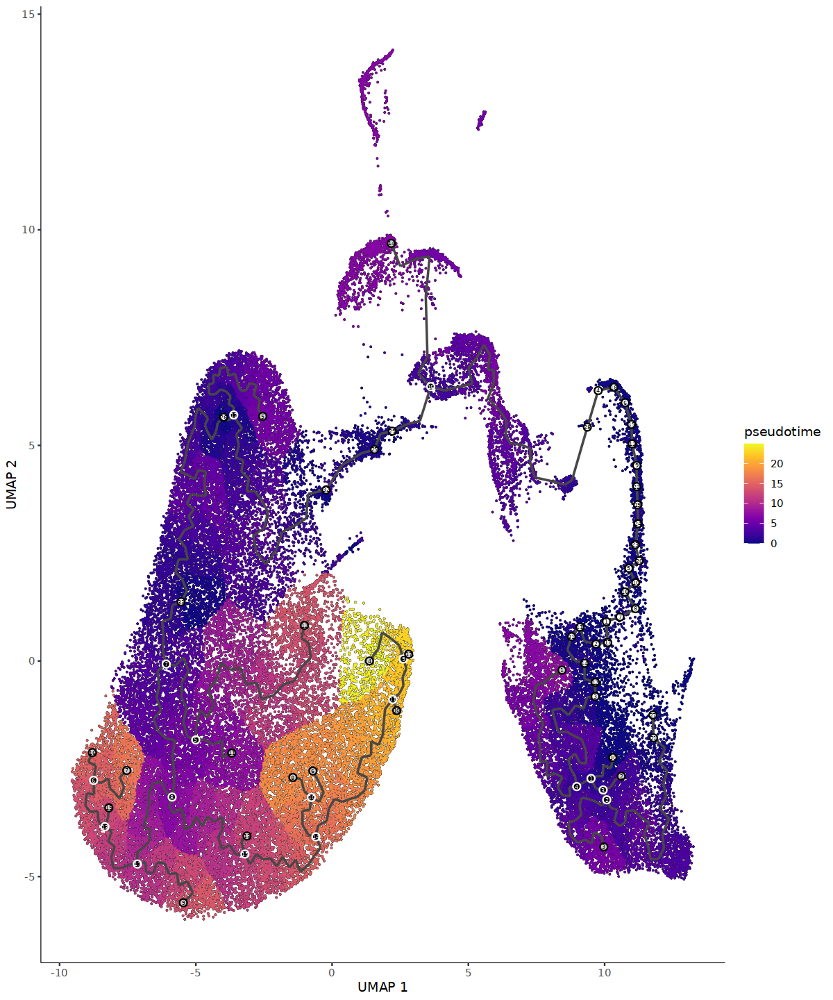

In [132]:
#--- plot cells within selected UMAP and inferred trajectory, colored based on pseudotime and label branches and leaves

plot_cells(cds,
           color_cells_by = "pseudotime",
           label_cell_groups=FALSE,
           label_leaves=TRUE,
           label_branch_points=TRUE,
           graph_label_size=1.5)

In [27]:
#--------- this step can be computationally demanding!!!!!!!!!!

#---- calculation DE along pseudotime for detection of specific gene_modules

pr_graph_test_res <- graph_test(cds, neighbor_graph="knn", cores=8)
pr_deg_ids <- row.names(subset(pr_graph_test_res, q_value < 0.05)) # testing of significantly expressed genes

  |==                                                      |   3%, ETA 02:37:53

In [ ]:
#---- create a dataframe with gene_modules
gene_module_df <- find_gene_modules(cds[pr_deg_ids,], resolution=1e-2)

In [ ]:
#----- assign aggregated geen expression along aligned cells for genes in gene_modules


cell_group_df <- tibble::tibble(cell=row.names(colData(cds)), 
                                cell_group=partitions(cds)[colnames(cds)])
agg_mat <- aggregate_gene_expression(cds, gene_module_df, cell_group_df)
row.names(agg_mat) <- stringr::str_c("Module ", row.names(agg_mat))
colnames(agg_mat) <- stringr::str_c("Partition ", colnames(agg_mat))

# --- plot heatmap of gene modules for each annotation cluster
pheatmap::pheatmap(agg_mat, cluster_rows=TRUE, cluster_cols=TRUE,
                   scale="column", clustering_method="ward.D2",
                   fontsize=6)

In [ ]:
#================== OPTION 2 - infer a new UMAP based on monocle3 dim reduction and repeat pseudotime analysis



In [42]:
#---- create cell_data_set object from above

cds2 <- SeuratWrappers::as.cell_data_set(o0)
cds2

recreate.partitions <- rep(1, length(cds2@colData@rownames))
names(recreate.partitions) <- cds2@colData@rownames
recreate.partitions <- as.factor(recreate.partitions)
cds2@clusters@listData[["UMAP"]][["partitions"]] <- recreate.partitions
list.cluster <- olig@active.ident
cds2@clusters@listData[["UMAP"]][["clusters"]] <- list.cluster

class: cell_data_set 
dim: 16196 60767 
metadata(0):
assays(2): counts logcounts
rownames(16196): SAMD11 NOC2L ... KDM5D EIF1AY
rowData names(0):
colnames(60767): ACC_4413_AAACCGGCAGCAAGGC-1
  ACC_4413_AACAAAGGTGCATTAG-1 ... hipp_5977_TTTGTTGGTCACGGAT-1
  hipp_5977_TTTGTTGGTTTGCTGT-1
colData names(87): orig.ident nCount_RNA ... ident Size_Factor
reducedDimNames(1): UMAP
mainExpName: RNA
altExpNames(0):

In [43]:
#--- check properties of cell_data_set
cds2
colnames(as.data.frame(colData(cds2)))

class: cell_data_set 
dim: 16196 60767 
metadata(0):
assays(2): counts logcounts
rownames(16196): SAMD11 NOC2L ... KDM5D EIF1AY
rowData names(0):
colnames(60767): ACC_4413_AAACCGGCAGCAAGGC-1
  ACC_4413_AACAAAGGTGCATTAG-1 ... hipp_5977_TTTGTTGGTCACGGAT-1
  hipp_5977_TTTGTTGGTTTGCTGT-1
colData names(87): orig.ident nCount_RNA ... ident Size_Factor
reducedDimNames(1): UMAP
mainExpName: RNA
altExpNames(0):

[1] "orig.ident"                        "nCount_RNA"                       
 [3] "nFeature_RNA"                      "gex_barcode"                      
 [5] "atac_barcode"                      "is_cell"                          
 [7] "excluded_reason"                   "gex_raw_reads"                    
 [9] "gex_mapped_reads"                  "gex_conf_intergenic_reads"        
[11] "gex_conf_exonic_reads"             "gex_conf_intronic_reads"          
[13] "gex_conf_exonic_unique_reads"      "gex_conf_exonic_antisense_reads"  
[15] "gex_conf_exonic_dup_reads"         "gex_exonic_umis"                  
[17] "gex_conf_intronic_unique_reads"    "gex_conf_intronic_antisense_reads"
[19] "gex_conf_intronic_dup_reads"       "gex_intronic_umis"                
[21] "gex_conf_txomic_unique_reads"      "gex_umis_count"                   
[23] "gex_genes_count"                   "atac_raw_reads"                   
[25] "atac_unmapped_reads"               "atac_lowmapq"                     
[27] "atac_dup_reads"                    "atac_chimeric_reads"              
[29] "atac_mitochondrial_reads"          "atac_fragments"                   
[31] "atac_TSS_fragments"                "atac_peak_region_fragments"       
[33] "atac_peak_region_cutsites"         "percent.mt"                       
[35] "nCount_ATAC"                       "nFeature_ATAC"                    
[37] "sex"                               "age"                              
[39] "mitoRatio"                         "percent.ribo"                     
[41] "riboRatio"                         "percent.hb"                       
[43] "log10GenesPerUMI"                  "nucleosome_signal"                
[45] "nucleosome_percentile"             "TSS.enrichment"                   
[47] "TSS.percentile"                    "pct_reads_in_peaks"               
[49] "blacklist_fraction"                "brain"                            
[51] "brain.bank"                        "nCount_SCT"                       
[53] "nFeature_SCT"                      "SCT_snn_res.0.2"                  
[55] "seurat_clusters"                   "ATAC_snn_res.0.2"                 
[57] "SCT.weight"                        "ATAC.weight"                      
[59] "wsnn_res.0.2"                      "RNA_snn_res.0.2"                  
[61] "pANN_0.25_0.09_1648"               "DF.classifications_0.25_0.09_1648"
[63] "pANN_0.25_0.09_1940"               "DF.classifications_0.25_0.09_1940"
[65] "pANN_0.25_0.09_2285"               "DF.classifications_0.25_0.09_2285"
[67] "pANN_0.25_0.09_1241"               "DF.classifications_0.25_0.09_1241"
[69] "SCT_snn_res.0.4"                   "ATAC_snn_res.0.4"                 
[71] "wsnn_res.0.4"                      "m1c_labels_subclass"              
[73] "age.group"                         "seurat_clusters_origBB"           
[75] "m1c_labels_subclass_origBB"        "anno_clus"                        
[77] "anno_clus_origBB"                  "anno_clus_origBB2"                
[79] "SCT.dream2BB.weight"               "ATAC.dream2BB.weight"             
[81] "seurat_clusters_dream.origBB"      "seurat_clusters_dreamorigBB"      
[83] "m1c_labels_subclass.dreamBB"       "anno_clus_dreamBB"                
[85] "anno_clus_dreamorigBB"             "ident"                            
[87] "Size_Factor"

No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

No trajectory to plot. Has learn_graph() been called yet?



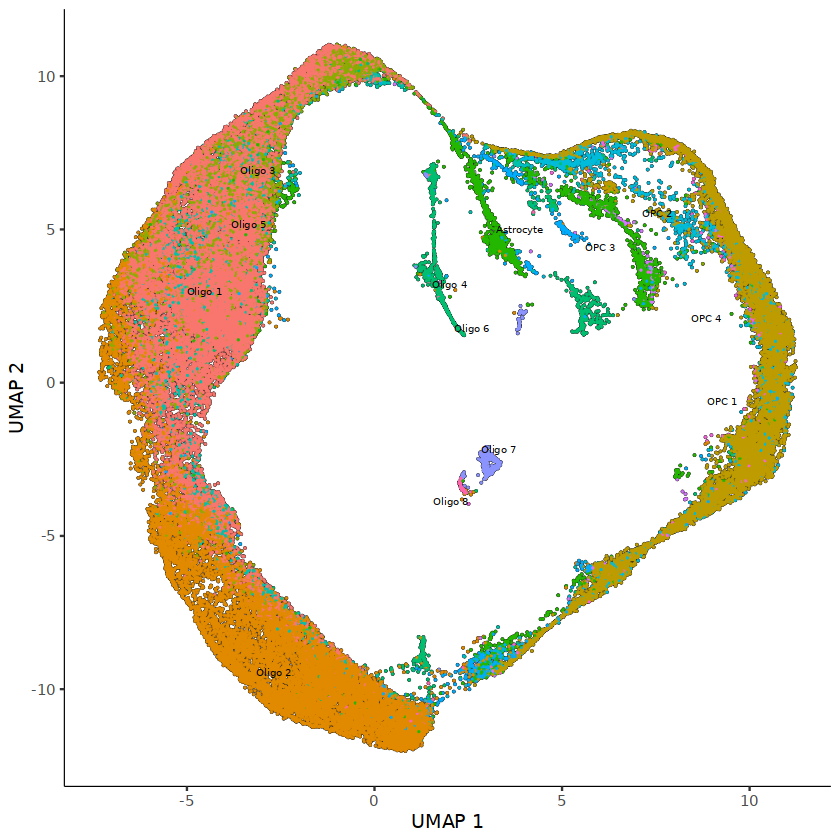

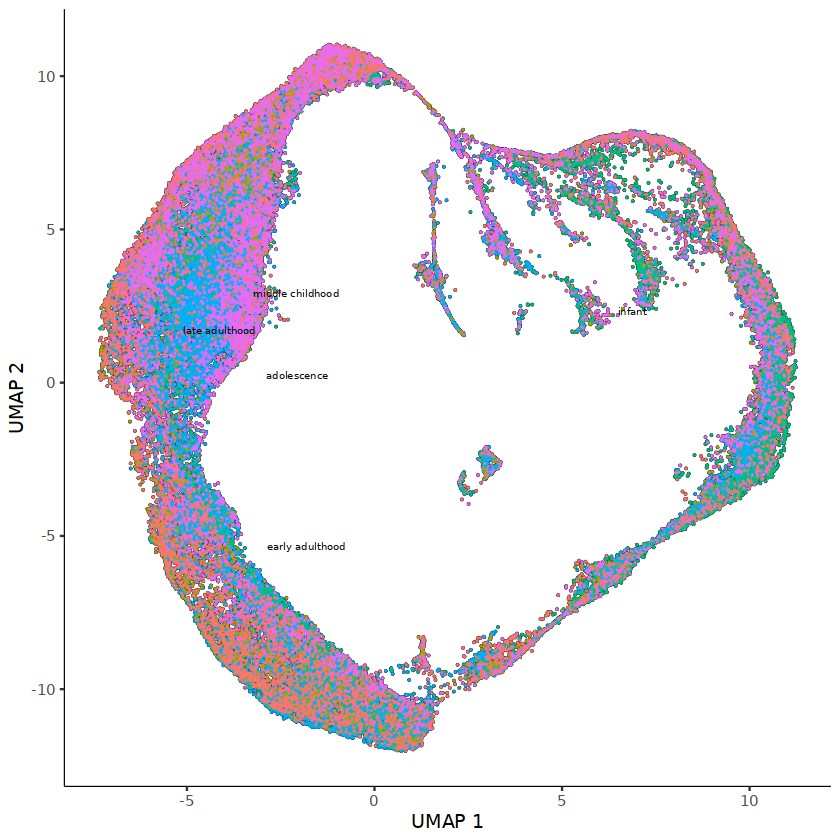

In [19]:
#--- preprocess data set
#--- run dimensionality reduction and UMAP calculation
#---- aligned cells 


#for reproducibility set seed!

set.seed(123)
cds <- preprocess_cds(cds, num_dim = 30)
cds <- reduce_dimension(cds)
plot_cells(cds, label_groups_by_cluster=FALSE,  color_cells_by = "anno_clus_dreamorigBB")
plot_cells(cds, label_groups_by_cluster=TRUE,  color_cells_by = "age.group")


No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

No trajectory to plot. Has learn_graph() been called yet?



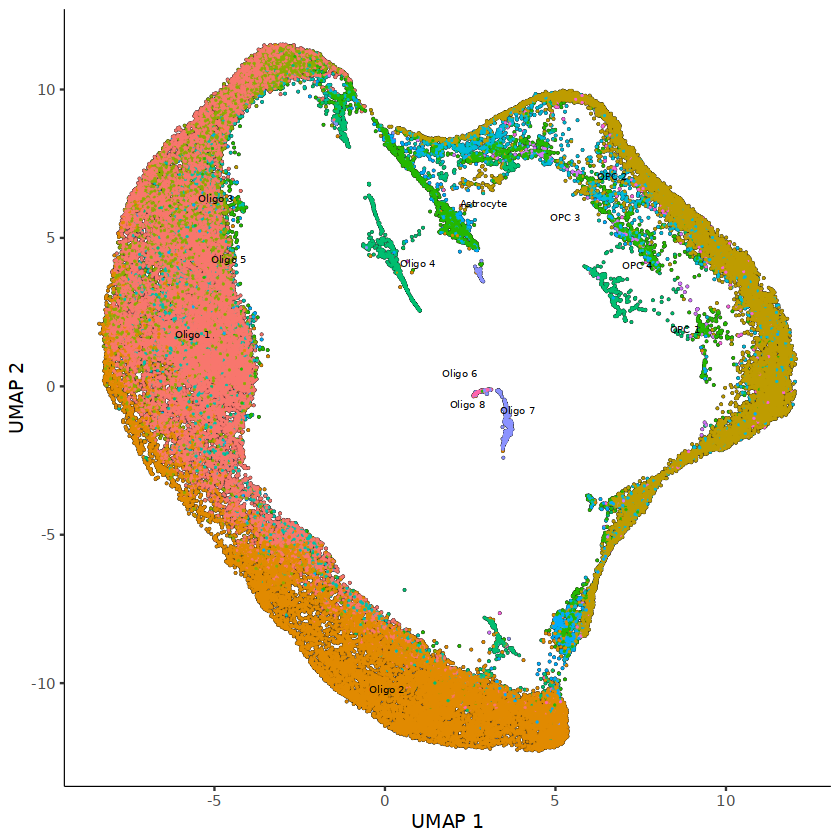

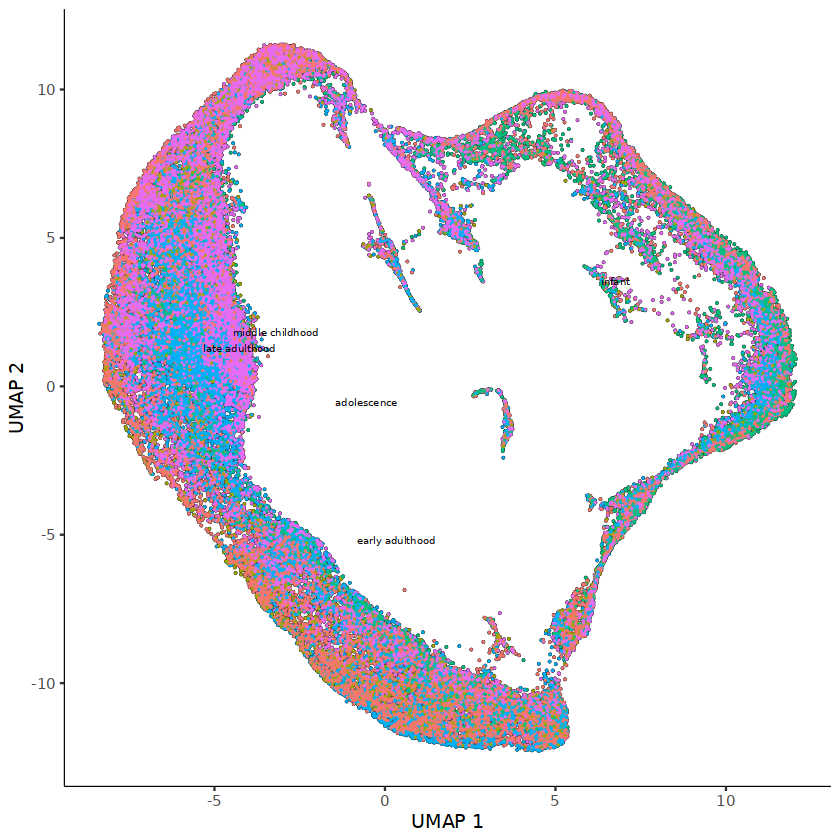

In [20]:
#--- repeat as above with different parameters for dim reduction


set.seed(123)
cds <- preprocess_cds(cds, num_dim = 15)
cds <- reduce_dimension(cds)
plot_cells(cds, label_groups_by_cluster=FALSE,  color_cells_by = "anno_clus_dreamorigBB")
plot_cells(cds, label_groups_by_cluster=TRUE,  color_cells_by = "age.group")


No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

No trajectory to plot. Has learn_graph() been called yet?



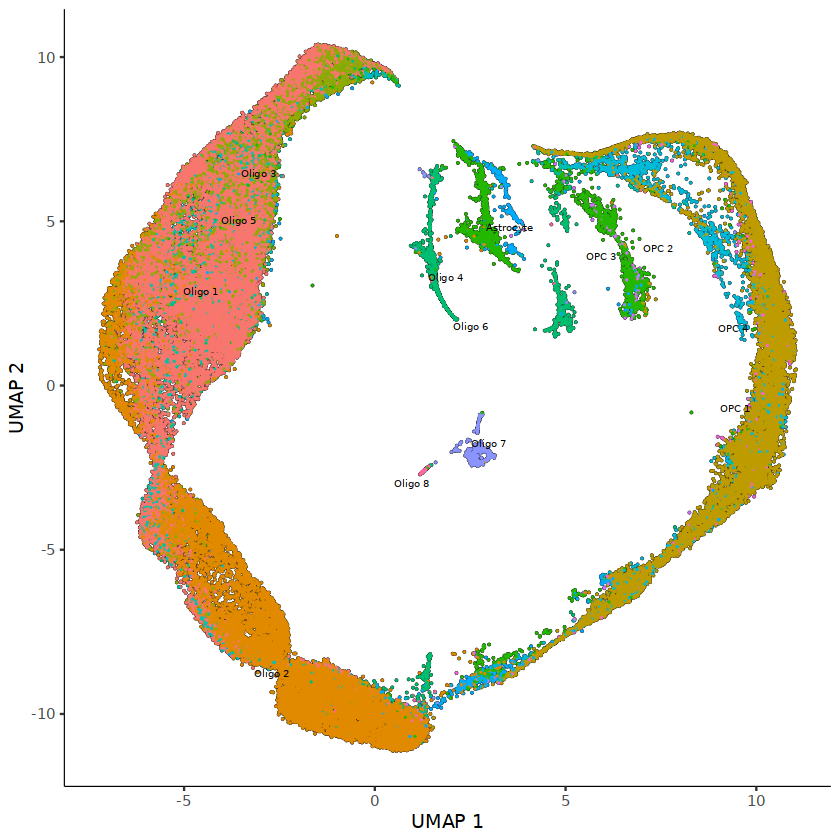

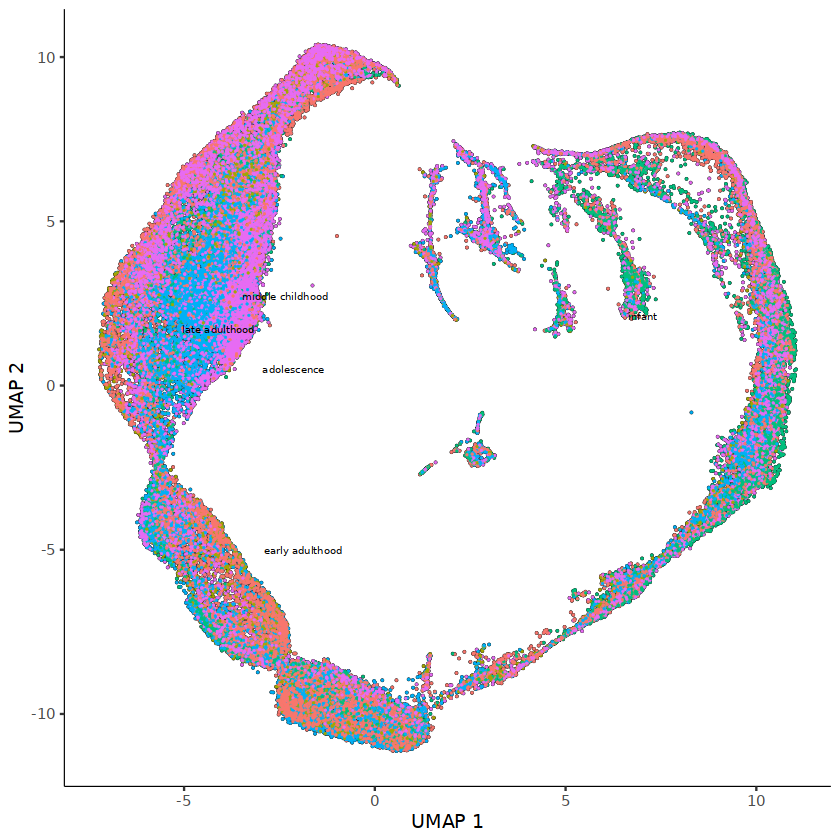

In [21]:
#--- repeat as above with different parameters for dim reduction

set.seed(123)
cds <- preprocess_cds(cds, num_dim = 50)
cds <- reduce_dimension(cds)
plot_cells(cds, label_groups_by_cluster=FALSE,  color_cells_by = "anno_clus_dreamorigBB")
plot_cells(cds, label_groups_by_cluster=TRUE,  color_cells_by = "age.group")


In [ ]:
#------- cluster cells

cds <- cluster_cells(cds)
plot_cells(cds, color_cells_by = "partition")

In [77]:
cds

class: cell_data_set 
dim: 16196 6077 
metadata(0):
assays(2): counts logcounts
rownames(16196): SAMD11 NOC2L ... KDM5D EIF1AY
rowData names(0):
colnames(6077): caudate_150663_AAAGGACGTACCGGAT-1
  caudate_150663_AACCTTAAGGAACGCG-1 ... ACC_4413_AGTGTGGCAATAGTCT-1
  caudate_150673_CAACAGGCAAAGCTAA-1
colData names(87): orig.ident nCount_RNA ... ident Size_Factor
reducedDimNames(1): UMAP
mainExpName: RNA
altExpNames(0):

In [ ]:
#--------- repeat OPTION2 approach on downsampled data to see how it affects dim reduction and trajectory 

No preprocess_method specified, using preprocess_method = 'PCA'

No trajectory to plot. Has learn_graph() been called yet?

No trajectory to plot. Has learn_graph() been called yet?



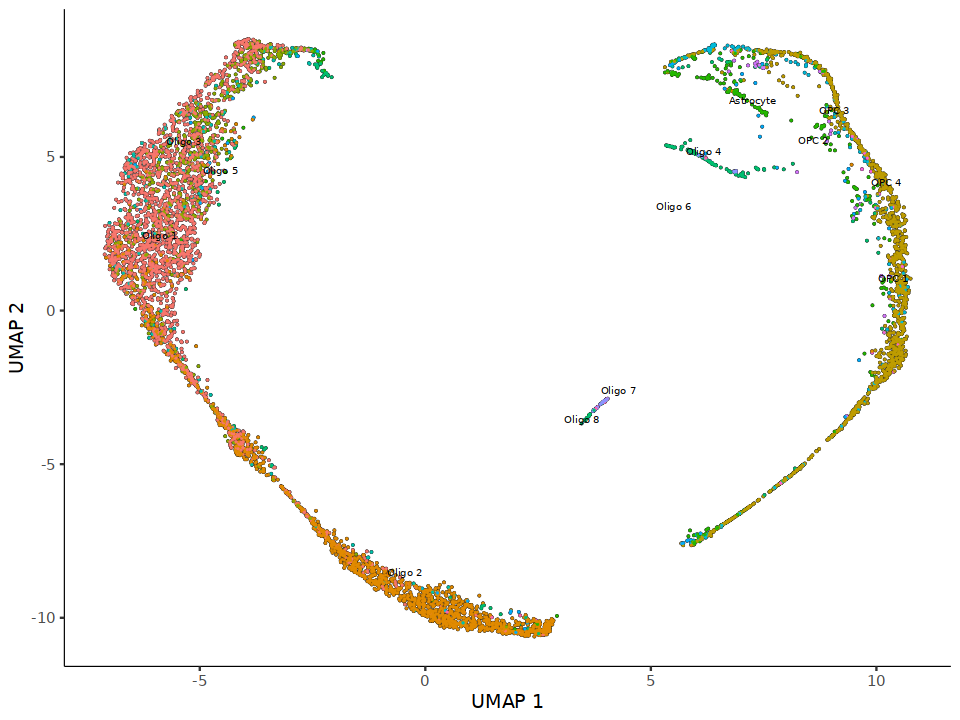

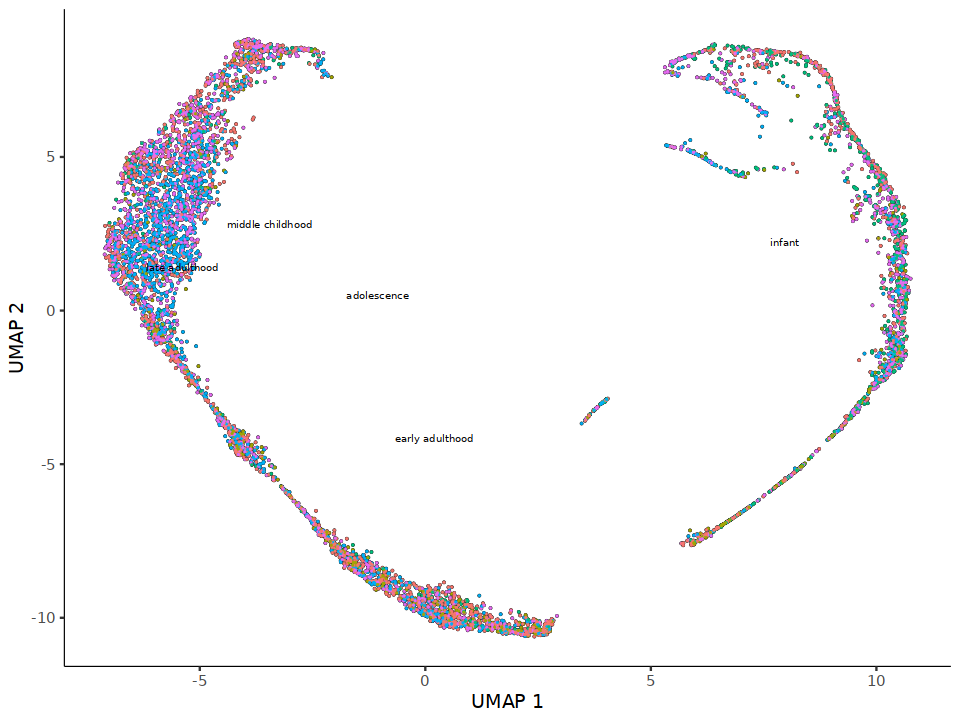

In [79]:
set.seed(123)
cds <- preprocess_cds(cds, num_dim = 30)
cds <- reduce_dimension(cds)


options(repr.plot.width=8, repr.plot.height=6)

plot_cells(cds, label_groups_by_cluster=FALSE,  color_cells_by = "anno_clus_dreamorigBB")
plot_cells(cds, label_groups_by_cluster=TRUE,  color_cells_by = "age.group")


No trajectory to plot. Has learn_graph() been called yet?



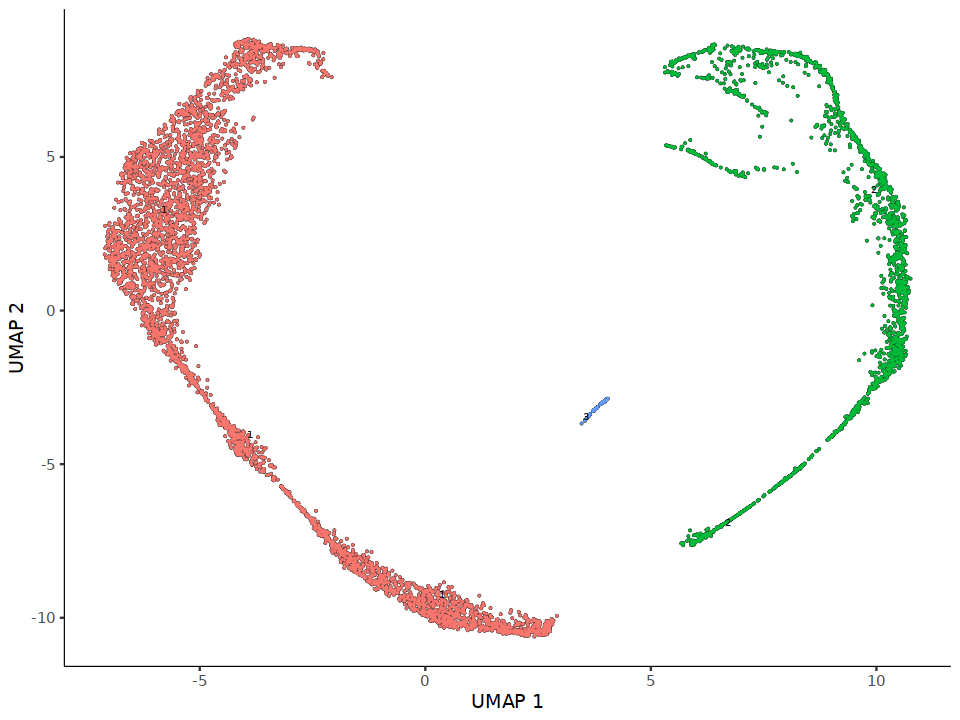

In [80]:
cds <- cluster_cells(cds)
plot_cells(cds, color_cells_by = "partition")

  |======================================================================| 100%
  |======================================================================| 100%


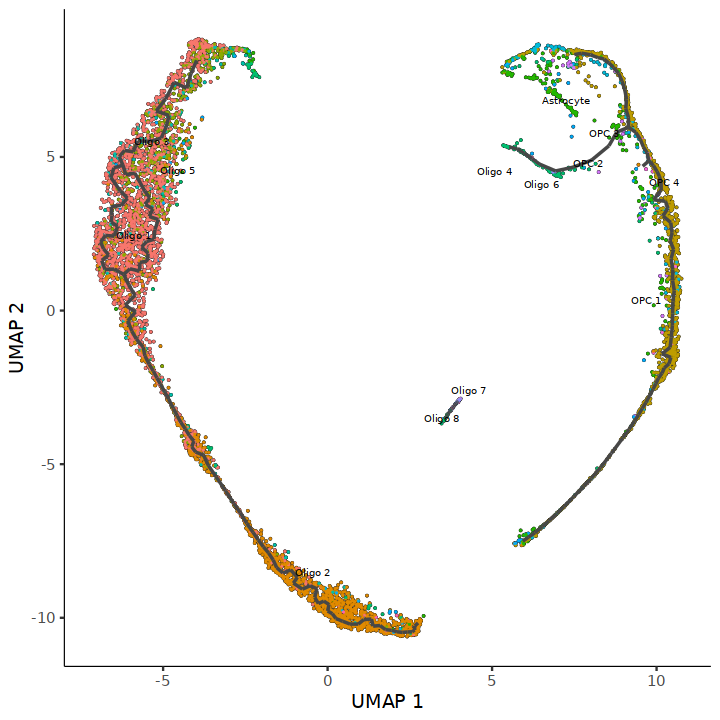

In [81]:
#---- learn graph for trajectory

cds <- learn_graph(cds)

# set size of the plotted figure
options(repr.plot.width=6, repr.plot.height=6)

# plot cells
plot_cells(cds,
           color_cells_by = "anno_clus_dreamorigBB",
           label_groups_by_cluster=FALSE,
           label_leaves=FALSE,
           label_branch_points=FALSE)

In [83]:
#====== a helper function to identify the root principal points:
get_earliest_principal_node <- function(cds, time_bin="OPC 2"){
  cell_ids <- which(colData(cds)[, "anno_clus_dreamorigBB"] == time_bin)
  
  closest_vertex <-
  cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
  igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
  (which.max(table(closest_vertex[cell_ids,]))))]
  
  root_pr_nodes
}
cds <- order_cells(cds, root_pr_nodes=get_earliest_principal_node(cds))


Cells aren't colored in a way that allows them to be grouped.



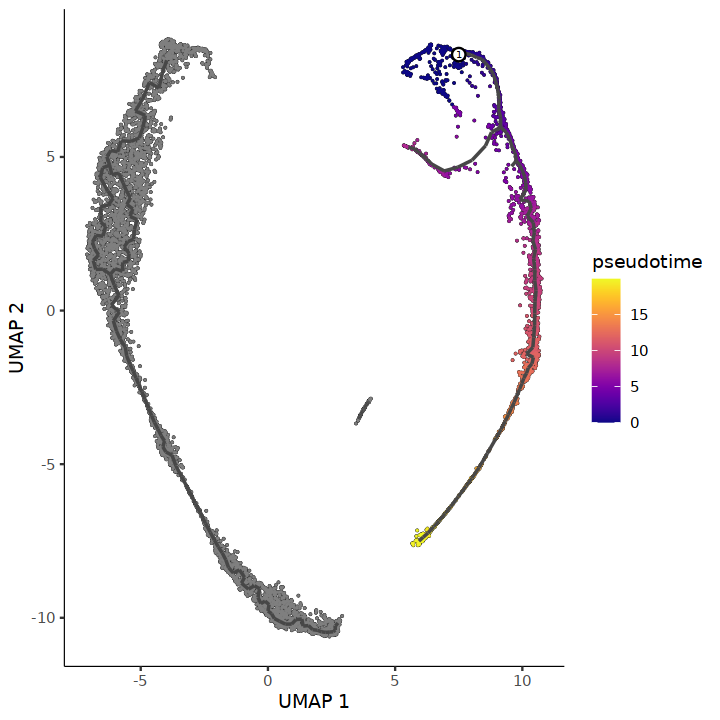

In [84]:
plot_cells(cds,
           color_cells_by = "pseudotime",
           label_groups_by_cluster=FALSE,
           label_leaves=FALSE,
           label_branch_points=FALSE)

In [85]:
cds$anno_clus_dreamorigBB_age <- paste(cds$anno_clus_dreamorigBB, cds$age.group, sep=' ')
unique(cds$anno_clus_dreamorigBB_age)

[1] "Oligo 1 late adulthood"     "OPC 1 early adulthood"     
 [3] "Oligo 1 adolescence"        "Oligo 1 middle childhood"  
 [5] "Oligo 2 adolescence"        "Oligo 2 middle childhood"  
 [7] "OPC 1 late adulthood"       "OPC 1 adolescence"         
 [9] "Oligo 4 late adulthood"     "Oligo 3 late adulthood"    
[11] "Oligo 2 early adulthood"    "Oligo 1 early adulthood"   
[13] "OPC 1 middle childhood"     "Astrocyte infant"          
[15] "OPC 1 infant"               "Oligo 2 late adulthood"    
[17] "Astrocyte adolescence"      "Astrocyte late adulthood"  
[19] "Astrocyte middle childhood" "Oligo 2 infant"            
[21] "Oligo 3 middle childhood"   "Oligo 3 adolescence"       
[23] "Oligo 3 early adulthood"    "Oligo 7 infant"            
[25] "OPC 4 infant"               "Oligo 5 late adulthood"    
[27] "Oligo 5 infant"             "OPC 2 infant"              
[29] "OPC 2 adolescence"          "OPC 4 middle childhood"    
[31] "Oligo 6 middle childhood"   "Oligo 4 middle childhood"  
[33] "Oligo 1 infant"             "Oligo 7 middle childhood"  
[35] "OPC 3 adolescence"          "Oligo 5 middle childhood"  
[37] "Oligo 8 adolescence"        "Oligo 7 late adulthood"    
[39] "Oligo 4 adolescence"        "Oligo 6 late adulthood"    
[41] "Oligo 6 adolescence"        "Oligo 6 infant"            
[43] "OPC 2 middle childhood"     "Oligo 4 infant"            
[45] "Oligo 7 adolescence"        "Oligo 7 early adulthood"   
[47] "OPC 2 early adulthood"      "Oligo 4 early adulthood"   
[49] "Astrocyte early adulthood"  "Oligo 8 early adulthood"   
[51] "OPC 4 adolescence"          "Oligo 5 adolescence"       
[53] "Oligo 5 early adulthood"    "Oligo 3 infant"            
[55] "Oligo 8 late adulthood"     "Oligo 8 infant"            
[57] "Oligo 6 early adulthood"    "Oligo 8 middle childhood"

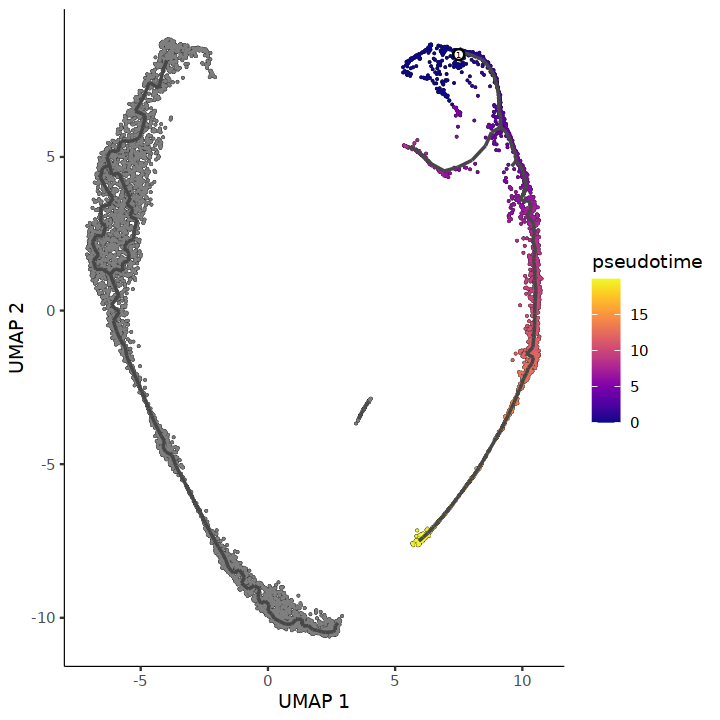

In [86]:
# a helper function to identify the root principal points:
get_earliest_principal_node <- function(cds, time_bin="OPC 2 infant"){
  cell_ids <- which(colData(cds)[, "anno_clus_dreamorigBB_age"] == time_bin)
  
  closest_vertex <-
  cds@principal_graph_aux[["UMAP"]]$pr_graph_cell_proj_closest_vertex
  closest_vertex <- as.matrix(closest_vertex[colnames(cds), ])
  root_pr_nodes <-
  igraph::V(principal_graph(cds)[["UMAP"]])$name[as.numeric(names
  (which.max(table(closest_vertex[cell_ids,]))))]
  
  root_pr_nodes
}
cds <- order_cells(cds, root_pr_nodes=get_earliest_principal_node(cds))


plot_cells(cds,
           color_cells_by = "pseudotime",
           label_cell_groups=FALSE,
           label_leaves=FALSE,
           label_branch_points=FALSE,
           graph_label_size=1.5)

In [87]:
#----- calculate significant genes and put them into gene modules
ciliated_cds_pr_test_res <- graph_test(cds, neighbor_graph="principal_graph", cores=4)
pr_deg_ids <- row.names(subset(ciliated_cds_pr_test_res, q_value < 0.05))

  |=======================================================| 100%, Elapsed 02:15


In [88]:
# check first top genes 
head(pr_deg_ids)

[1] "SAMD11"   "C1orf159" "ACAP3"    "CCNL2"    "ATAD3C"   "MIB2"

In [94]:
# prepr dataframe of gene_modules
gene_module_df <- find_gene_modules(cds[pr_deg_ids,], resolution=c(10^seq(-6,-1)))


In [95]:
head(gene_module_df)

id,module,supermodule,dim_1,dim_2
<chr>,<fct>,<fct>,<dbl>,<dbl>
SAMD11,25,1,8.292909,3.3617787
C1orf159,8,1,2.415910,-1.5753746
ACAP3,53,6,-8.163424,-1.3691388
CCNL2,19,1,-1.437900,0.3005443
ATAD3C,22,1,2.685675,-1.6024251
MIB2,2,1,2.601290,-0.3072148


In [102]:
# -- prep dataframe of cell barcodes
cell_group_df <- tibble::tibble(cell=row.names(colData(cds)), 
                                cell_group=colData(cds)$anno_clus_dreamorigBB)


In [103]:
head(cell_group_df)

cell,cell_group
<chr>,<fct>
caudate_150663_AAAGGACGTACCGGAT-1,Oligo 1
caudate_150663_AACCTTAAGGAACGCG-1,Oligo 1
caudate_150663_CAATGAACAATGAAGC-1,Oligo 1
hipp_150659_TTAGGCCCAGCAACAG-1,OPC 1
DLPFC_150666_CTCGCTAGTATTACCC-1,Oligo 1
DLPFC_150671_TACTGGCCAGTTTGGC-1,Oligo 1


In [104]:
#--- prepare an aggregated matrix across each cell type and gene_module
agg_mat <- aggregate_gene_expression(cds, gene_module_df, cell_group_df)
head(agg_mat)

,Oligo 1,Oligo 2,OPC 1,Oligo 3,Astrocyte,Oligo 4,Oligo 5,OPC 2,Oligo 6,Oligo 7,OPC 3,OPC 4,Oligo 8
25,-0.4698723,-0.983143,0.1821407,-0.6903614,1.3230056,-0.3020248,-0.74035391,0.005830928,-0.88713321,0.44555304,1.6525416,1.6617991,-1.1979825
8,0.2863713,2.764814,-0.7056861,-0.2273614,-0.4980549,-0.1164795,-0.02779341,-0.742045568,-0.04591852,-0.01714892,-0.9890649,-0.8102870,1.1286549
53,-0.2630856,3.000000,-0.5366356,-0.5335335,-0.2869778,-0.1965093,-0.38089666,-0.283632081,0.34087398,0.22300247,-0.8675450,-0.7051432,0.4211218
19,-0.4773869,2.581767,-0.5204243,-0.6914930,-0.2293535,-0.3550144,-0.30479701,-0.581304904,0.33477862,0.77352447,-0.9539158,-0.7976515,1.2212716
22,0.1424829,1.740847,-0.7253601,-0.2828362,-0.7402397,-0.2856753,-0.39764688,-0.682896890,-0.17194522,1.66402438,-1.1537260,-0.6850274,1.5779990
2,-0.6130218,2.049755,-0.2043583,-0.9522194,-0.2613638,-0.3578475,-0.56628230,-0.506769927,2.05030052,0.44750676,-1.0415981,-0.3464541,0.3023533


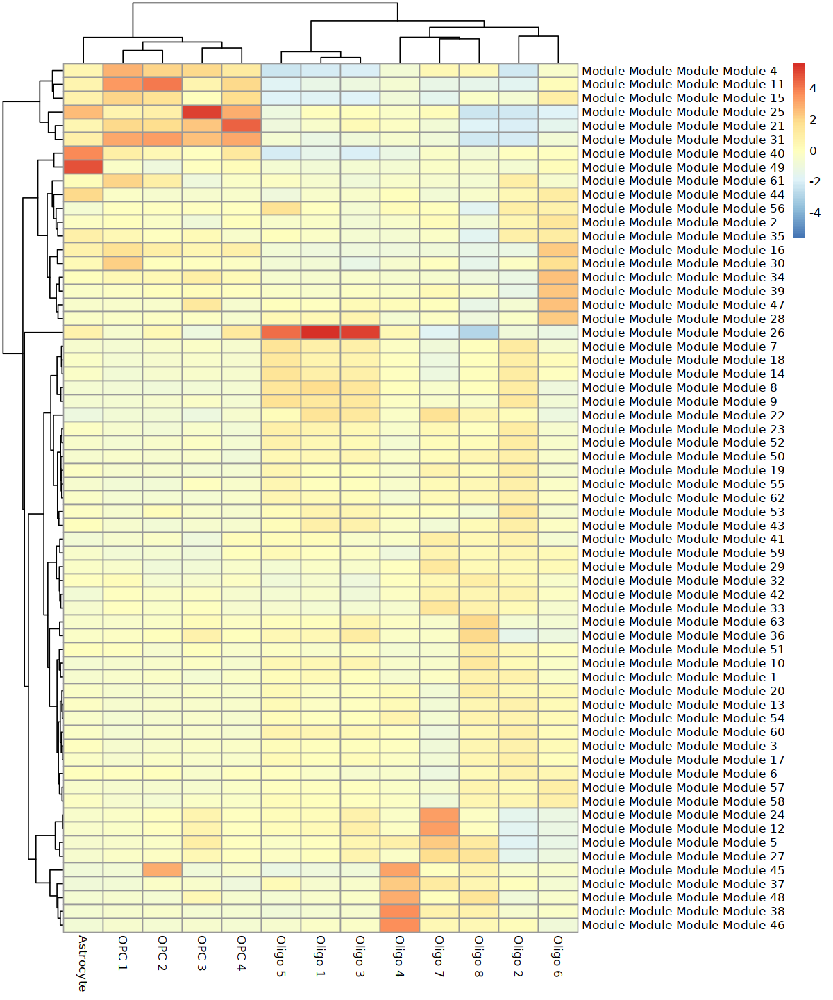

In [108]:
#------- plot the gene_module matrix across each cell type
options(repr.plot.width=10, repr.plot.height=12)

row.names(agg_mat) <- stringr::str_c("Module ", row.names(agg_mat))
pheatmap::pheatmap(agg_mat,
                   scale="column", clustering_method="ward.D2")

In [114]:
#--- filter gene_modules of interest; in this case 21/25/26
head(gene_module_df)
gene_module_df %>% filter(module %in% c(26, 25,21))

id,module,supermodule,dim_1,dim_2
<chr>,<fct>,<fct>,<dbl>,<dbl>
SAMD11,25,1,8.292909,3.3617787
C1orf159,8,1,2.415910,-1.5753746
ACAP3,53,6,-8.163424,-1.3691388
CCNL2,19,1,-1.437900,0.3005443
ATAD3C,22,1,2.685675,-1.6024251
MIB2,2,1,2.601290,-0.3072148


id,module,supermodule,dim_1,dim_2
<chr>,<fct>,<fct>,<dbl>,<dbl>
SAMD11,25,1,8.292909,3.361779
TMEM52,26,1,9.857851,1.764432
PLEKHG5,21,1,6.769447,3.549822
DISP3,21,1,6.873297,4.090500
LRRC38,25,1,8.997605,3.178882
PLA2G5,25,1,8.545953,3.214669
MYOM3,26,1,9.739668,2.206278
XKR8,26,1,9.740965,1.618182
GJA4,21,1,6.466215,3.335501


In [169]:
cds

class: cell_data_set 
dim: 16196 60767 
metadata(1): citations
assays(2): counts logcounts
rownames(16196): SAMD11 NOC2L ... KDM5D EIF1AY
rowData names(0):
colnames(60767): ACC_4413_AAACCGGCAGCAAGGC-1
  ACC_4413_AACAAAGGTGCATTAG-1 ... hipp_5977_TTTGTTGGTCACGGAT-1
  hipp_5977_TTTGTTGGTTTGCTGT-1
colData names(89): orig.ident nCount_RNA ... anno_clus_dreamorigBB_age
  PSEUDOTIME
reducedDimNames(2): UMAP PCA
mainExpName: RNA
altExpNames(0):

In [170]:
#---- get pseudotime metadata slot

ps_tim <- pseudotime(cds)
head(ps_tim)
cds$PSEUDOTIME <- ps_tim
#cds@colData$PSEUDOTIME

ACC_4413_AAACCGGCAGCAAGGC-1 ACC_4413_AACAAAGGTGCATTAG-1 
                   24.64349                    15.13459 
ACC_4413_AACTCACAGTATCGCG-1 ACC_4413_AAGCAAGTCCTTGTTG-1 
                   22.99706                    19.80349 
ACC_4413_AAGCGAATCCCTGGTT-1 ACC_4413_AAGGATTAGGGTGAAC-1 
                   23.11468                    25.80882

In [173]:
#---- convert metadata slots of pseudotime, age.group and cluster annotation into data.frame
dd = as.data.frame(cds@colData$PSEUDOTIME)
d1 = as.data.frame(cds@colData$age.group)
d2 = as.data.frame(cds@colData$anno_clus_dreamorigBB)
DF <- cbind(dd, d1, d2)


In [174]:
head(DF)



,cds@colData$PSEUDOTIME,cds@colData$age.group,cds@colData$anno_clus_dreamorigBB
,<dbl>,<chr>,<fct>
ACC_4413_AAACCGGCAGCAAGGC-1,24.64349,infant,OPC 1
ACC_4413_AACAAAGGTGCATTAG-1,15.13459,infant,OPC 2
ACC_4413_AACTCACAGTATCGCG-1,22.99706,infant,OPC 1
ACC_4413_AAGCAAGTCCTTGTTG-1,19.80349,infant,OPC 1
ACC_4413_AAGCGAATCCCTGGTT-1,23.11468,infant,OPC 1
ACC_4413_AAGGATTAGGGTGAAC-1,25.80882,infant,OPC 2


In [175]:
#---- rename columns
colnames(DF)
colnames(DF) <- c('pseudotime', 'age.group', 'anno')
colnames(DF)

[1] "cds@colData$PSEUDOTIME"            "cds@colData$age.group"            
[3] "cds@colData$anno_clus_dreamorigBB"

[1] "pseudotime" "age.group"  "anno"

In [176]:
head(DF)

,pseudotime,age.group,anno
,<dbl>,<chr>,<fct>
ACC_4413_AAACCGGCAGCAAGGC-1,24.64349,infant,OPC 1
ACC_4413_AACAAAGGTGCATTAG-1,15.13459,infant,OPC 2
ACC_4413_AACTCACAGTATCGCG-1,22.99706,infant,OPC 1
ACC_4413_AAGCAAGTCCTTGTTG-1,19.80349,infant,OPC 1
ACC_4413_AAGCGAATCCCTGGTT-1,23.11468,infant,OPC 1
ACC_4413_AAGGATTAGGGTGAAC-1,25.80882,infant,OPC 2


Warning message in stat_summary(fun.data = "mean_sdl", mult = 1, geom = "crossbar", :
"Ignoring unknown parameters: `mult`"
Warning message:
"Removed 1289 rows containing non-finite values (`stat_ydensity()`)."
Warning message:
"Removed 1289 rows containing non-finite values (`stat_summary()`)."
Warning message in stat_summary(fun.data = mean_sdl, mult = 1, geom = "pointrange", :
"Ignoring unknown parameters: `mult`"
Warning message:
"Removed 1289 rows containing non-finite values (`stat_ydensity()`)."
Warning message:
"Removed 1289 rows containing non-finite values (`stat_summary()`)."


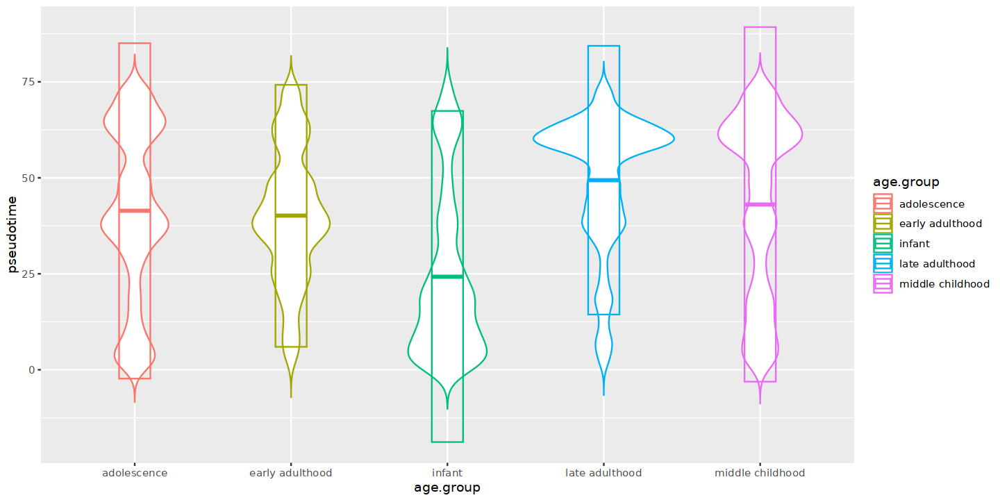

Warning message:
"Removed 1289 rows containing non-finite values (`stat_ydensity()`)."


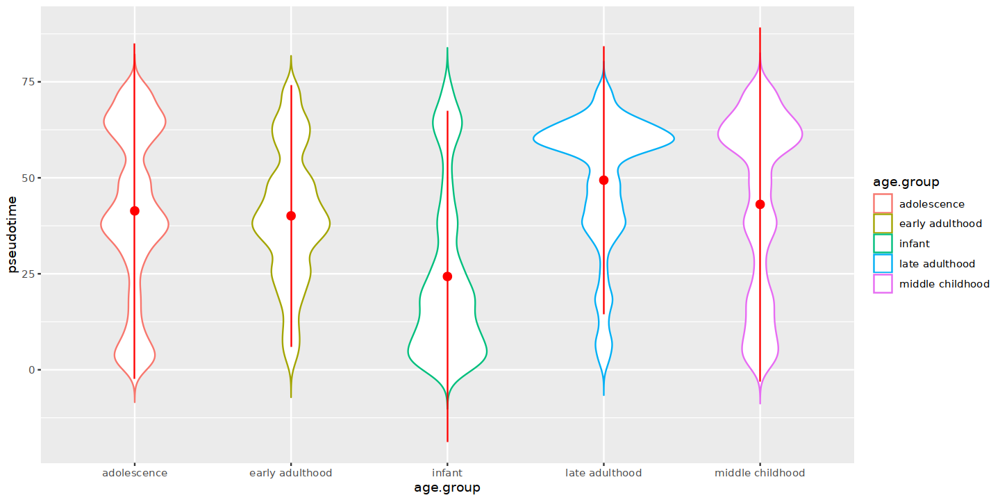

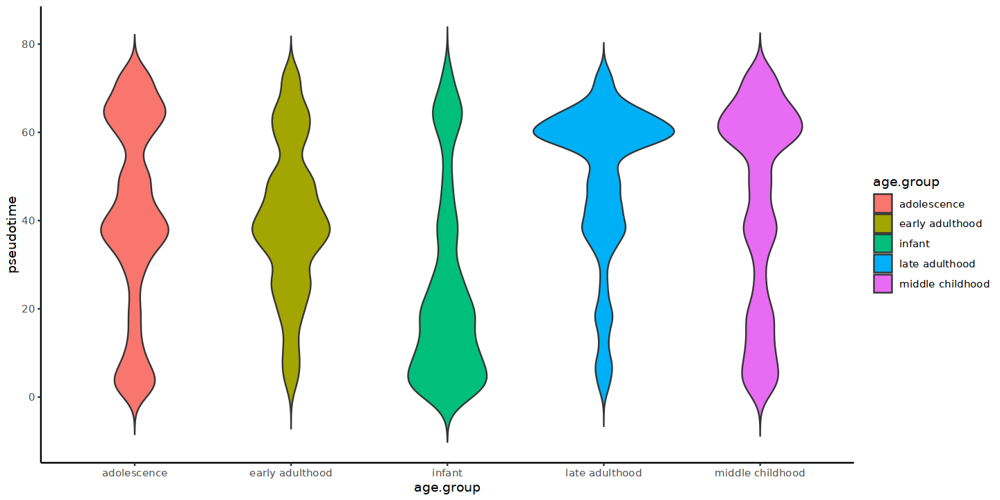

In [177]:
#---- plot distribution of pseudotime across age.group or annotated clusters as violin plot

p <- ggplot(DF, aes(x=age.group, y=pseudotime, color=age.group)) + 
    geom_violin(trim=FALSE)

options(repr.plot.width=12, repr.plot.height=6)

p + stat_summary(fun.data="mean_sdl", mult=1, 
                 geom="crossbar", width=0.2 )
p + stat_summary(fun.data=mean_sdl, mult=1, 
                 geom="pointrange", color="red")

ggplot(DF, aes(x=age.group, y=pseudotime, fill=age.group)) + 
    geom_violin(trim=FALSE)+
theme_classic()

In [179]:
#-- save results as csv
getwd()
write.csv(DF, './DF_pseudotime_monocle3_pca30.csv')

[1] "/sc/arion/projects/CommonMind/3D_Genome/single_cell/cellranger/Merged_data"

In [180]:
#--- gene module detection again 
ciliated_cds_pr_test_res <- graph_test(cds, neighbor_graph="principal_graph", cores=4)
pr_deg_ids <- row.names(subset(ciliated_cds_pr_test_res, q_value < 0.05))

  |=======================================================| 100%, Elapsed 21:51


In [181]:
gene_module_df <- find_gene_modules(cds[pr_deg_ids,], resolution=c(10^seq(-6,-1)))

In [182]:
cell_group_df <- tibble::tibble(cell=row.names(colData(cds)), 
                                cell_group=colData(cds)$anno_clus_dreamorigBB)

In [183]:
agg_mat <- aggregate_gene_expression(cds, gene_module_df, cell_group_df)
head(agg_mat)

,Oligo 1,Oligo 2,OPC 1,Oligo 3,Astrocyte,Oligo 4,Oligo 5,OPC 2,Oligo 6,Oligo 7,OPC 3,OPC 4,Oligo 8
58,-0.61349558,1.794992,-0.6763466,-0.83399767,-0.6430549,0.1511512,-0.5385499,-0.8161528,0.7968710,0.6674130,-0.6073294,-0.6707143,1.98921409
13,-1.31743346,0.659459,0.7839831,-1.35233424,0.6341640,-0.4332973,-1.1696725,-0.1820014,2.1317706,-0.7210008,0.3012094,0.4291349,0.23601885
3,-0.58645739,2.677816,-0.6334980,-0.73843763,-0.4225874,-0.1269675,-0.4275640,-0.6678245,1.3320490,-0.1817908,-0.3851127,-0.5308292,0.69120368
26,-0.25803022,3.000000,-0.6095648,-0.51207786,-0.5061903,-0.2330665,-0.1249995,-0.6560759,0.5521846,-0.1816098,-0.4442706,-0.5319202,0.41487862
41,-0.02651248,3.000000,-0.6506408,-0.04740066,-0.4756180,-0.1916949,-0.1190152,-0.6393430,0.1557360,-0.2392641,-0.5404550,-0.4952629,0.06562202
22,-0.59942893,2.493517,-0.6600844,-0.77323072,-0.6257222,-0.2170824,-0.4888384,-0.7621863,0.5542539,0.8499515,-0.4369359,-0.5860059,1.25179260


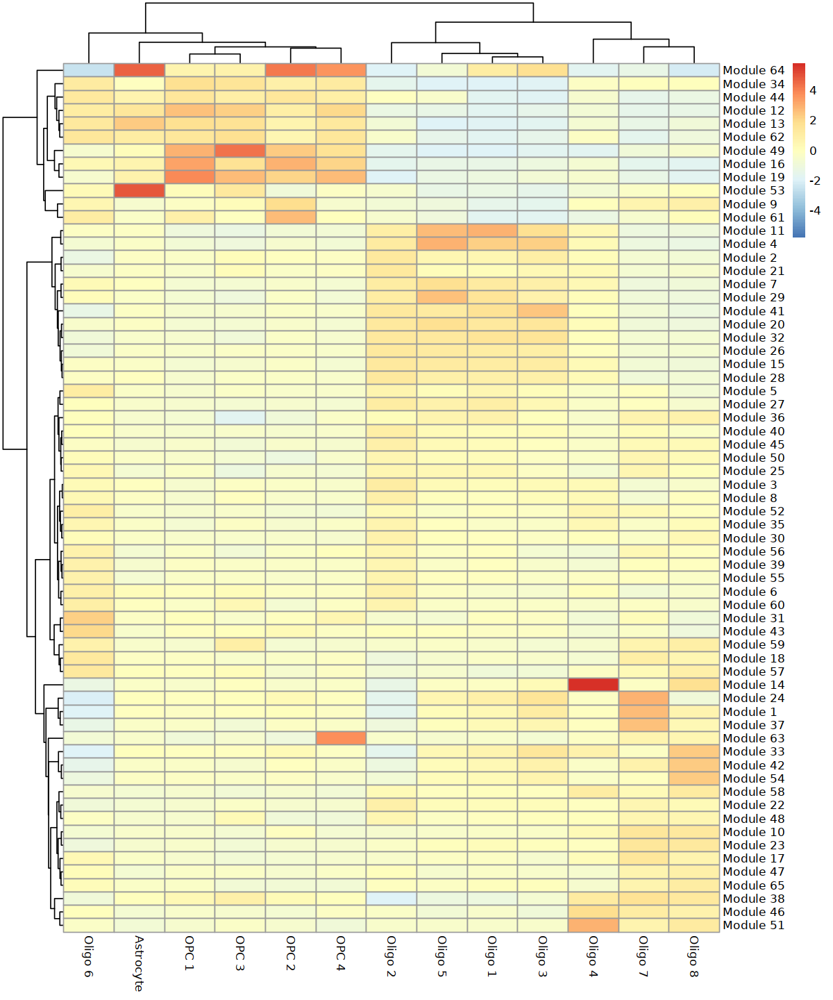

In [184]:
options(repr.plot.width=10, repr.plot.height=12)

row.names(agg_mat) <- stringr::str_c("Module ", row.names(agg_mat))
pheatmap::pheatmap(agg_mat,
                   scale="column", clustering_method="ward.D2")

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2021... Done.
  Querying GO_Cellular_Component_2021... Done.
  Querying GO_Biological_Process_2021... Done.
  Querying KEGG_2021_Human... Done.
  Querying Elsevier_Pathway_Collection... Done.
Parsing results... Done.


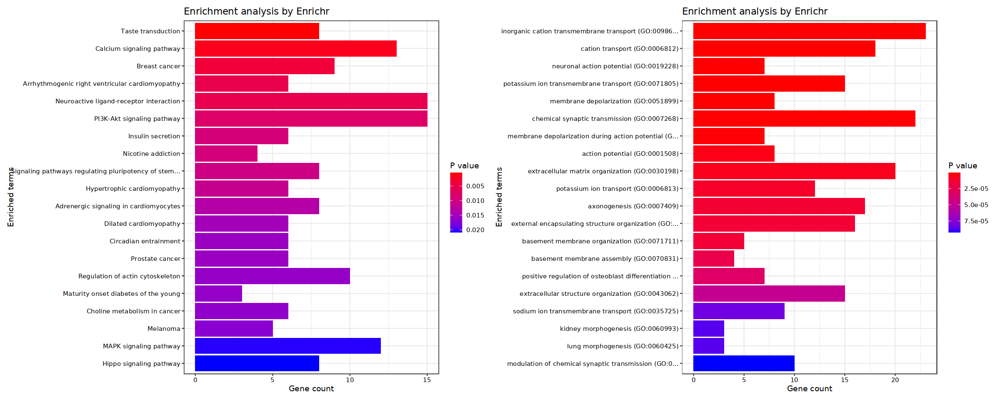

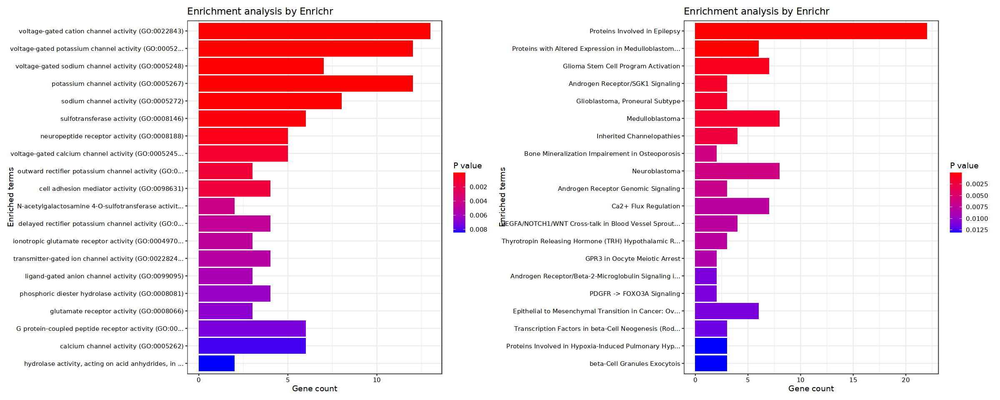

In [48]:
#----perform GO enrichment via EnrichR for selected genes of interest
library(EnrichR)

options(repr.plot.width=20, repr.plot.height=8)

GENES <- unique(gene_module_df[which(gene_module_df$module %in% OPC12_early),]$id)



#selected tested databases from EnrichR and GO
dbs <- c("GO_Molecular_Function_2021", "GO_Cellular_Component_2021", "GO_Biological_Process_2021",
            "KEGG_2021_Human", "Elsevier_Pathway_Collection")
if (websiteLive) {
        enriched <- enrichr(GENES, dbs)
    }
p0<- if (websiteLive) plotEnrich(enriched[[4]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p1<- if (websiteLive) plotEnrich(enriched[[3]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
#p2<- if (websiteLive) plotEnrich(enriched[[2]], showTerms = 20, numChar = 50, 
                          #        y = "Count", orderBy = "Adjusted.P.value")
p3<-if (websiteLive) plotEnrich(enriched[[1]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p4<-if (websiteLive) plotEnrich(enriched[[5]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
    
p0+p1
p3+p4

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2021... Done.
  Querying GO_Cellular_Component_2021... Done.
  Querying GO_Biological_Process_2021... Done.
  Querying KEGG_2021_Human... Done.
  Querying Elsevier_Pathway_Collection... Done.
Parsing results... Done.


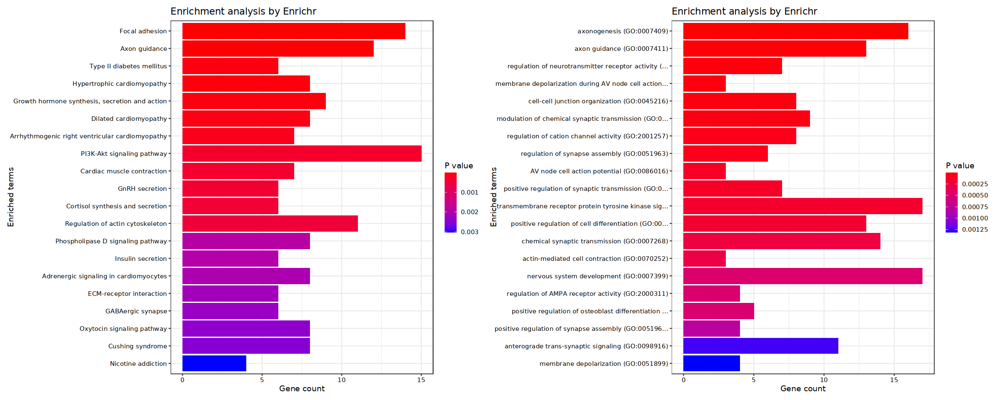

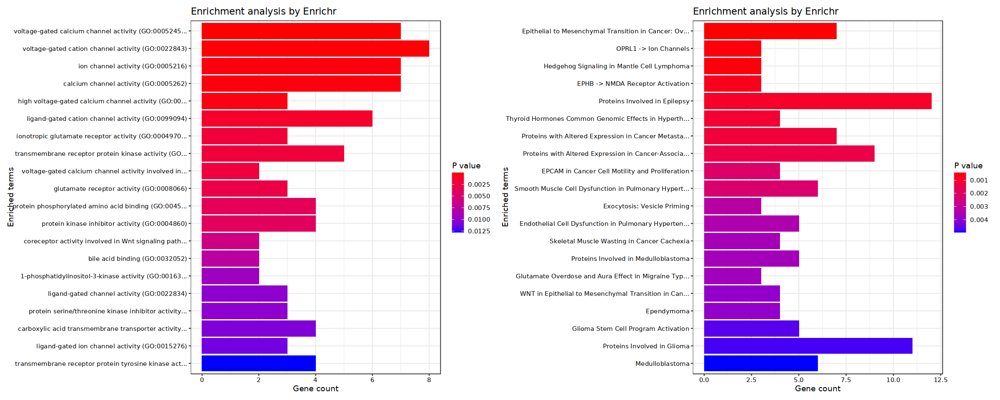

In [49]:
#---- OPC1_2 late

options(repr.plot.width=20, repr.plot.height=8)

GENES <- unique(gene_module_df2[which(gene_module_df2$module %in% OPC12_late),]$id)



    #EnrichR and GO
dbs <- c("GO_Molecular_Function_2021", "GO_Cellular_Component_2021", "GO_Biological_Process_2021",
            "KEGG_2021_Human", "Elsevier_Pathway_Collection")
if (websiteLive) {
        enriched <- enrichr(GENES, dbs)
    }
p0<- if (websiteLive) plotEnrich(enriched[[4]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p1<- if (websiteLive) plotEnrich(enriched[[3]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
#p2<- if (websiteLive) plotEnrich(enriched[[2]], showTerms = 20, numChar = 50, 
                          #        y = "Count", orderBy = "Adjusted.P.value")
p3<-if (websiteLive) plotEnrich(enriched[[1]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p4<-if (websiteLive) plotEnrich(enriched[[5]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
    
p0+p1
p3+p4

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2021... Done.
  Querying GO_Cellular_Component_2021... Done.
  Querying GO_Biological_Process_2021... Done.
  Querying KEGG_2021_Human... Done.
  Querying Elsevier_Pathway_Collection... Done.
Parsing results... Done.


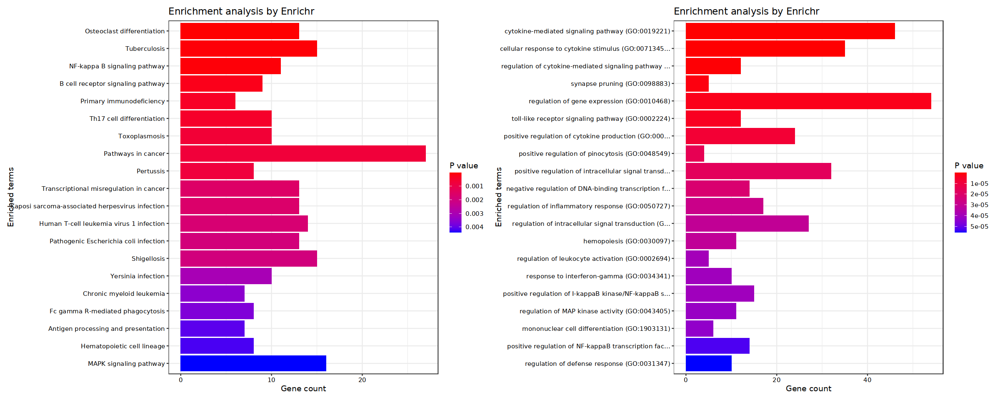

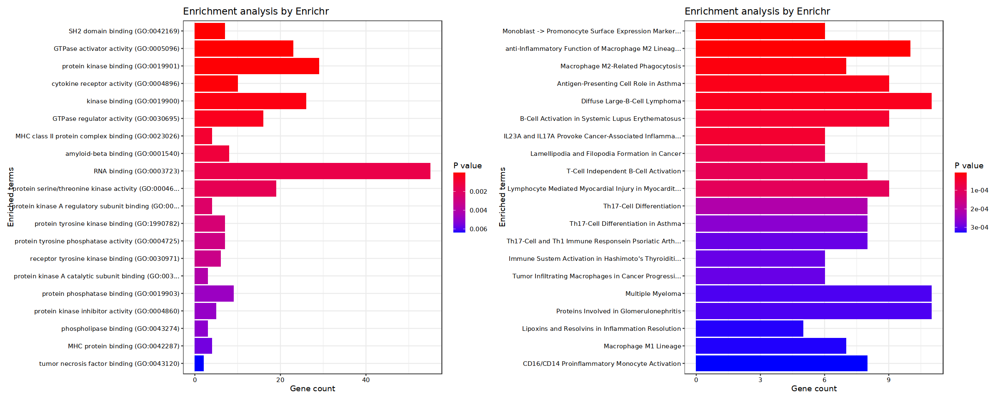

In [51]:
#---- Olig4 early

options(repr.plot.width=20, repr.plot.height=8)

GENES <- unique(gene_module_df[which(gene_module_df$module %in% Olig4_early),]$id)



    #EnrichR and GO
dbs <- c("GO_Molecular_Function_2021", "GO_Cellular_Component_2021", "GO_Biological_Process_2021",
            "KEGG_2021_Human", "Elsevier_Pathway_Collection")
if (websiteLive) {
        enriched <- enrichr(GENES, dbs)
    }
p0<- if (websiteLive) plotEnrich(enriched[[4]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p1<- if (websiteLive) plotEnrich(enriched[[3]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
#p2<- if (websiteLive) plotEnrich(enriched[[2]], showTerms = 20, numChar = 50, 
                          #        y = "Count", orderBy = "Adjusted.P.value")
p3<-if (websiteLive) plotEnrich(enriched[[1]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p4<-if (websiteLive) plotEnrich(enriched[[5]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
    
p0+p1
p3+p4

Uploading data to Enrichr... Done.
  Querying GO_Molecular_Function_2021... Done.
  Querying GO_Cellular_Component_2021... Done.
  Querying GO_Biological_Process_2021... Done.
  Querying KEGG_2021_Human... Done.
  Querying Elsevier_Pathway_Collection... Done.
Parsing results... Done.


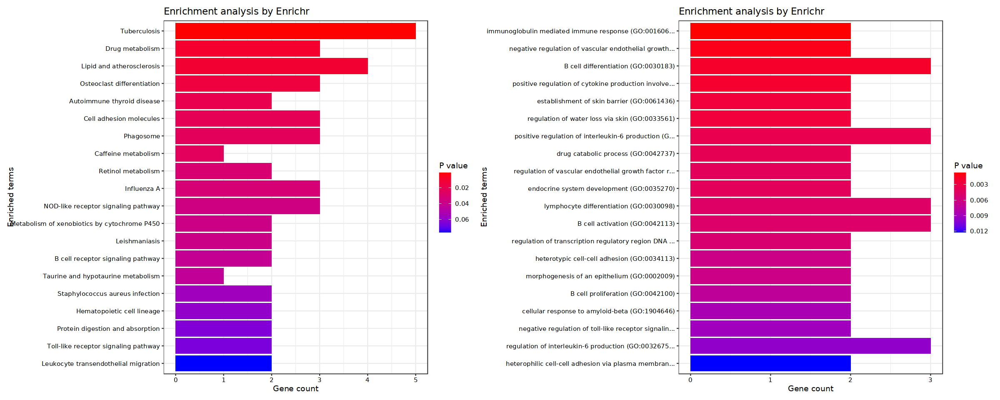

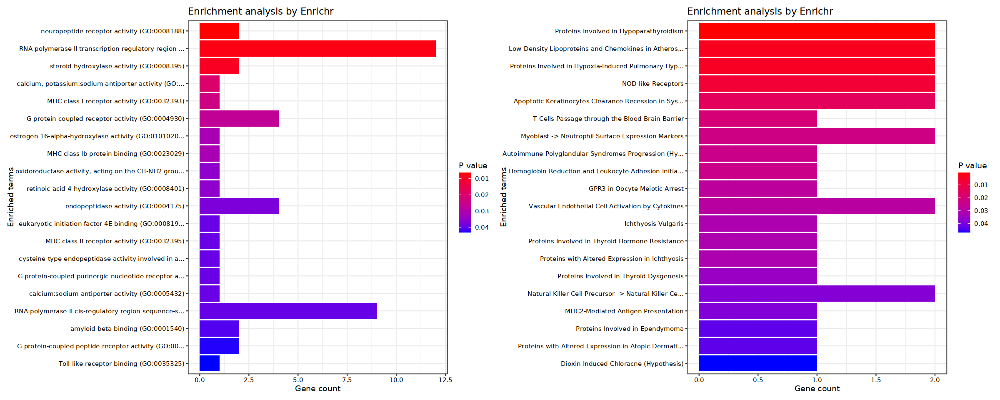

In [50]:
#---- Olig4 late

options(repr.plot.width=20, repr.plot.height=8)

GENES <- unique(gene_module_df2[which(gene_module_df2$module %in% Olig4_late),]$id)



    #EnrichR and GO
dbs <- c("GO_Molecular_Function_2021", "GO_Cellular_Component_2021", "GO_Biological_Process_2021",
            "KEGG_2021_Human", "Elsevier_Pathway_Collection")
if (websiteLive) {
        enriched <- enrichr(GENES, dbs)
    }
p0<- if (websiteLive) plotEnrich(enriched[[4]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p1<- if (websiteLive) plotEnrich(enriched[[3]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
#p2<- if (websiteLive) plotEnrich(enriched[[2]], showTerms = 20, numChar = 50, 
                          #        y = "Count", orderBy = "Adjusted.P.value")
p3<-if (websiteLive) plotEnrich(enriched[[1]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
p4<-if (websiteLive) plotEnrich(enriched[[5]], showTerms = 20, numChar = 50, 
                                      y = "Count", orderBy = "Adjusted.P.value")
    
p0+p1
p3+p4